In [1]:
# use webuiapi.py from webuiapi folder
import sys
sys.path.append('./webuiapi')

# or install using pip install webuiapi

In [3]:
import webuiapi

# api = webuiapi.WebUIApi()
api = webuiapi.WebUIApi(host='127.0.0.1',
                        port=7860,
                        sampler='Euler a',
                        steps=20)

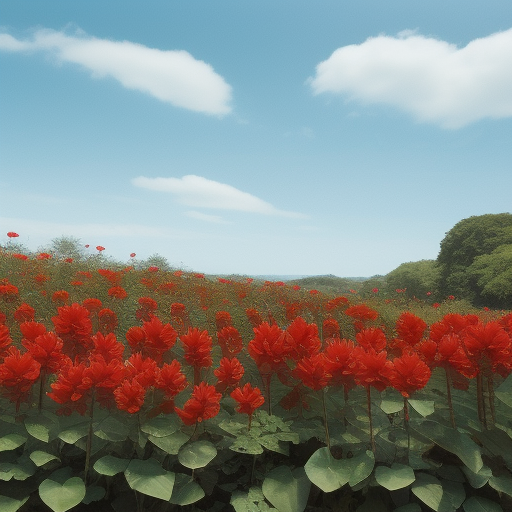

In [78]:
# txt2img

result1 = api.txt2img(prompt="extinct red flower ",
                    seed=-1,
                    styles=[""],
                    cfg_scale=7,
                      sampler_index='Euler a',
                      steps=20,
                    )
result1.image

In [65]:
%matplotlib tk
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig = plt.figure(figsize=(20,30))

img=result1.image

def onclick(event):
    ix, iy = event.xdata, event.ydata
    print(ix, iy)

cid = fig.canvas.mpl_connect('button_press_event', onclick)

imgplot = plt.imshow(img)
# plt.show()
plt.plot()

[]

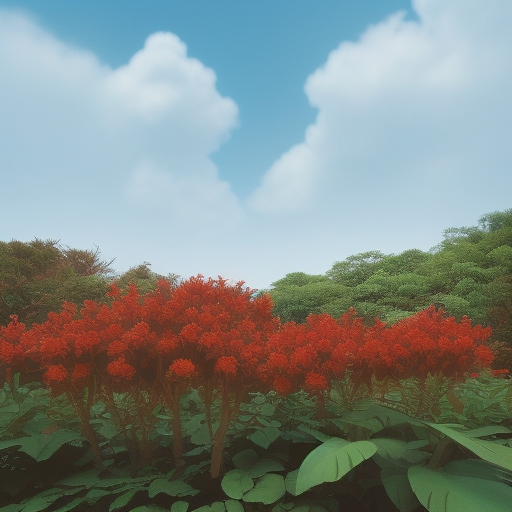

In [79]:
# img2img

result2 = api.img2img(images=[result1.image], prompt="extinct plant grow up on forest", seed=-1, cfg_scale=6.5, denoising_strength=0.6,save_images= True)
result2.image

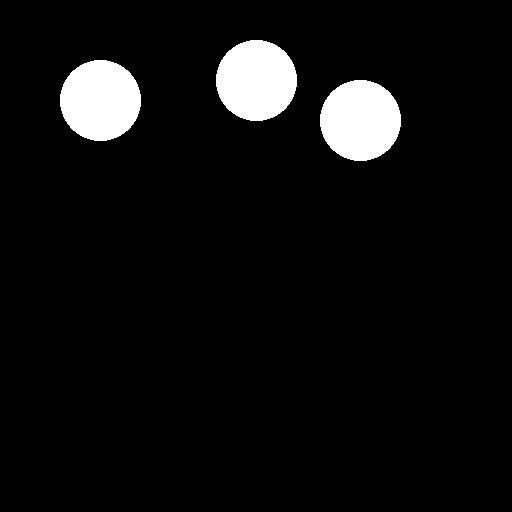

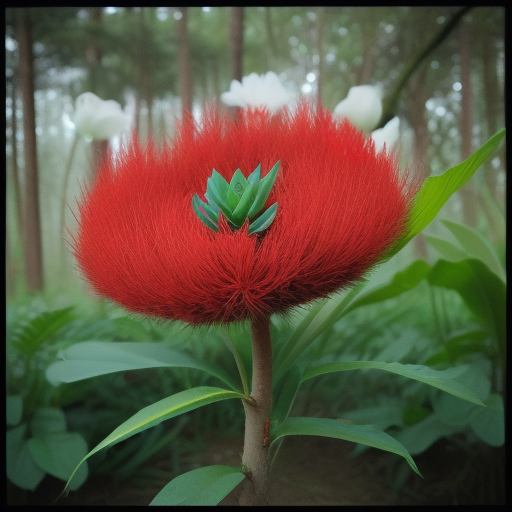

In [77]:
# inpainting with img2img

from PIL import Image, ImageDraw

mask = Image.new('RGB', result2.image.size, color = 'black')
# mask = result2.image.copy()
draw = ImageDraw.Draw(mask)
r=40
xx=100
yy=100
draw.ellipse((xx-r,yy-r,xx+r,yy+r), fill='white')
xx=256
yy=80
draw.ellipse((xx-r,yy-r,xx+r,yy+r), fill='white')
xx=360
yy=120
draw.ellipse((xx-r,yy-r,xx+r,yy+r), fill='white')
# mask

inpainting_result = api.img2img(images=[result2.image],
                                mask_image=mask,
                                inpainting_fill=1,
                                prompt="lot of red flower",
                                seed=104,
                                cfg_scale=5.0,
                                denoising_strength=0.7)
display(mask)
inpainting_result.image

(768, 768)


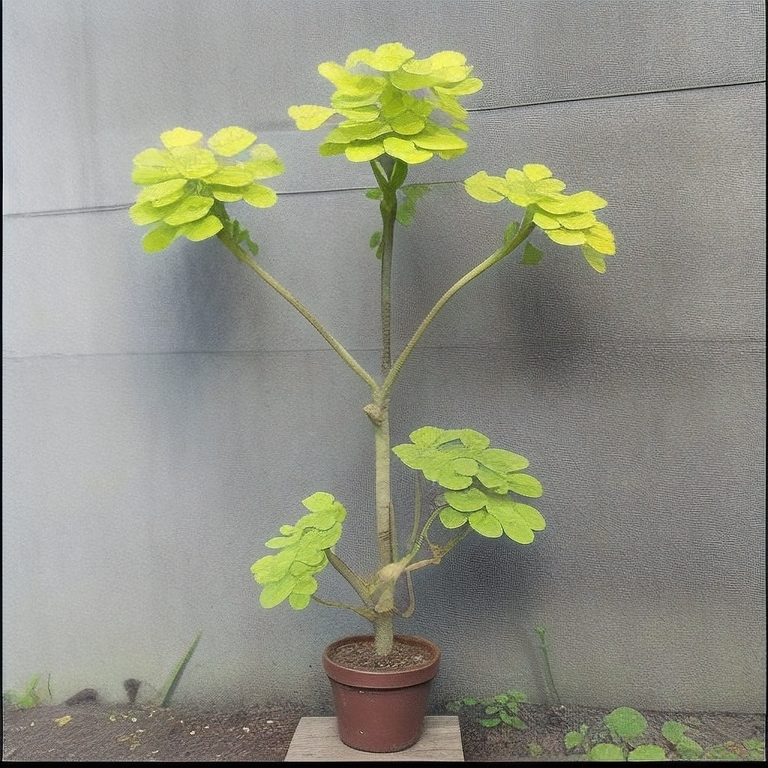

In [74]:
result3 = api.extra_single_image(image=result2.image,
                                 upscaler_1="ESRGAN_4x",
                                 upscaling_resize=1.5)
print(result3.image.size)
result3.image

In [6]:
result4 = api.extra_batch_images(images=[result1.image, result2.image],
                                 upscaler_1="ESRGAN_4x",
                                 upscaling_resize=1.5)
len(result4.images)

2

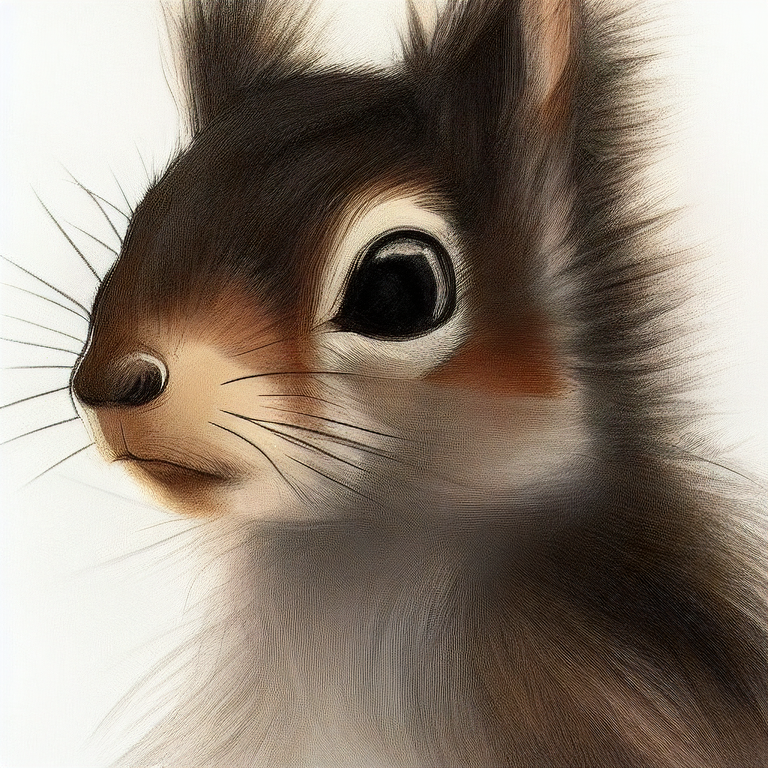

In [7]:
result4.images[0]

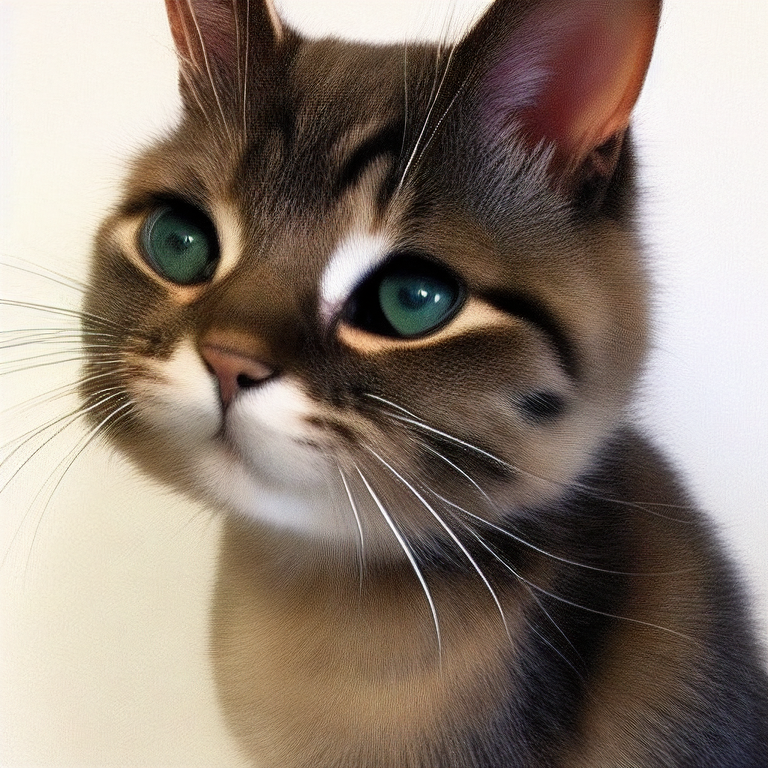

In [8]:
result4.images[1]

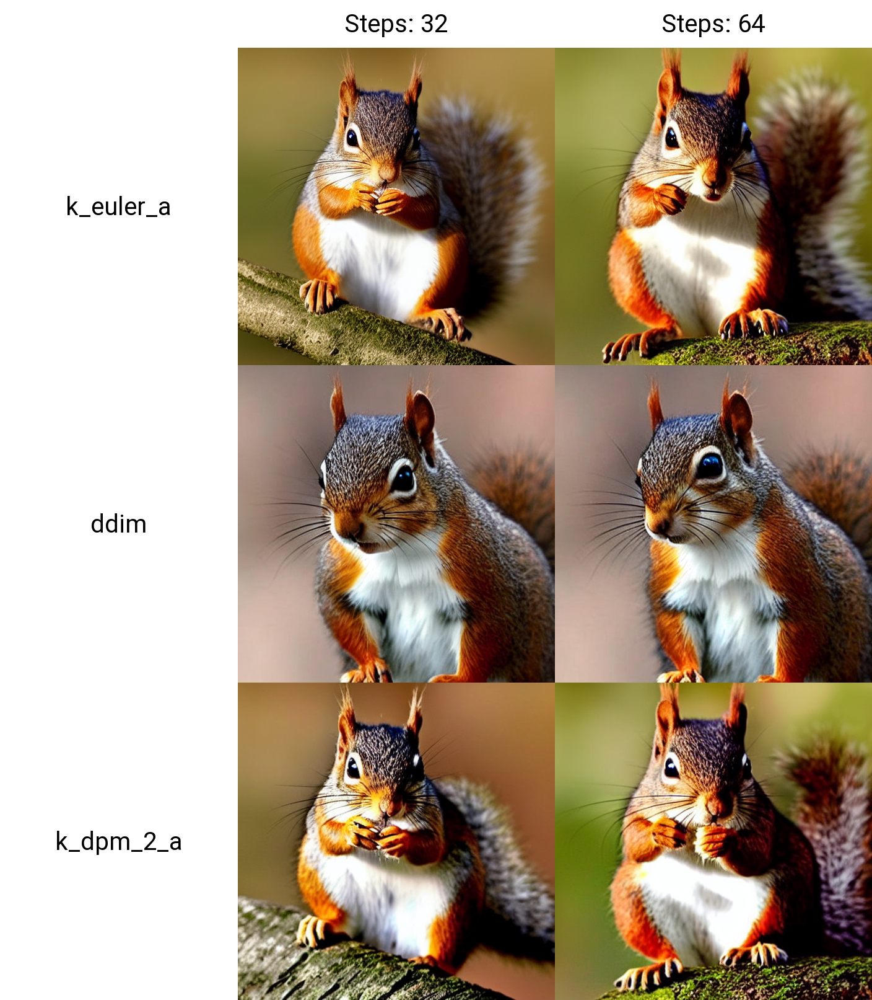

In [9]:
# txt2img with scripts
XYPlotAvailableScripts = [
    "Nothing",
    "Seed",
    "Var. seed",
    "Var. strength",
    "Steps",
    "CFG Scale",
    "Prompt S/R",
    "Prompt order",
    "Sampler",
    "Checkpoint Name",
    "Hypernetwork",
    "Hypernet str.",
    "Sigma Churn",
    "Sigma min",
    "Sigma max",
    "Sigma noise",
    "Eta",
    "Clip skip",
    "Denoising",
    "Hires upscaler",
    "Cond. Image Mask Weight",
    "VAE",
    "Styles"
]

# Example call
XAxisType = "Steps"
XAxisValues = "32,64"
YAxisType = "Sampler"
YAxisValues = "k_euler_a, ddim, k_dpm_2_a"
drawLegend = "True"
includeSeparateImages = "False"
keepRandomSeed = "False"

result5 = api.txt2img(
    prompt="cute squirrel",
    negative_prompt="ugly, out of frame",
    seed=1003,
    cfg_scale=7,
    script_name="X/Y Plot",
    script_args=[
        XYPlotAvailableScripts.index(XAxisType),
        XAxisValues,
        XYPlotAvailableScripts.index(YAxisType),
        YAxisValues,
        drawLegend,
        includeSeparateImages,
        keepRandomSeed
    ]
)

result5.image